# Towards spectral super-resolution in solar absorption lines from pseudomonochromatic images

## 2D Image regression

### Choose envinroment

In [18]:
try:
    # Intenta importar el módulo
    from google.colab import drive
    drive.mount('/content/drive')

    PATH = '/content/drive/MyDrive/Colab Notebooks/SUPER/assets/'
    SRC_PATH = PATH + 'src/'
    IMG_PATH = PATH + 'images/sol.h5'
    OUTPUT_PATH = PATH + 'outputs/models/'

except ImportError:
    SRC_PATH = 'assets/src/'
    IMG_PATH = 'assets/images/sol.h5'
    MODELS_PATH = 'assets/outputs/models/'
    REULTS_PATH = 'assets/outputs/results/'
    SIREN2D_IMAGES = REULTS_PATH + 'SIREN2D/images/'
    FF2D_IMAGES = REULTS_PATH + 'FF2D/images/'
    SUPERSIREN_IMAGES = REULTS_PATH + 'SUPERSIREN/images/'
    SUPERFF_IMAGES = REULTS_PATH + 'SUPERFF/images/'
    FINAL_IMAGES = REULTS_PATH + 'FINAL_MEMORY/images/'
    SOLAR_IMAGES = FINAL_IMAGES + 'solar_images/'
    TEST_RED_SQUARE = FINAL_IMAGES + 'test/'
    FINAL_VIDEOS = REULTS_PATH + 'FINAL_MEMORY/videos/'

### Libraries

In [2]:
# Import the 'sys' library to interact with the Python runtime environment.
import sys

# Import the 'copy' module from Python's standard library.
# This module provides the 'deepcopy' function, which can be used
# to create deep copies of mutable objects like dictionaries.
import copy

# Import the 'time' module to measure the time elapsed during certain operations or code execution
import time

# Import the NumPy library and rename it as np.
# NumPy is a library for numerical computing in Python and is especially useful for array operations.
import numpy as np

# Import the pyplot module from the Matplotlib library and rename it as plt.
# Matplotlib is a library for creating static, interactive, and animated visualizations in Python.
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Import the 'seaborn' library for data visualization. Seaborn is based on Matplotlib
# and provides a high-level interface for drawing attractive and informative statistical graphics.
import seaborn

# Import the PyTorch library for deep learning.
# PyTorch is an open-source machine learning library used for a variety of tasks,
# including classification, regression, and image generation.
import torch

# Import the functional module from nn and rename it as F.
# This module contains functions that can be used in defining operations of a neural network,
# such as activations and losses.
import torch.nn.functional as F

import pandas as pd
from IPython.display import display, Markdown

from tqdm.auto import tqdm

### Source files

In [3]:
# Append the SRC_PATH directory to the system path to make its modules accessible.
sys.path.append(SRC_PATH)

In [4]:
# Import all functions and variables from the 'utils' module located in the 'assets/src/' directory.
from utils import (get_data, get_experiment_data,
                   feat_scaling, crop, plot_data, normalize,
                   plot_metrics, plot_cube
                   )
from dataset import grid3D
from models import NeuralFieldSiren, NeuralFieldFF
from training import fourier_mapping

### Solar images

<p align='justify'>For the PFG, we have a real spectral data cube I(x, y, λ) of the photospheric absorption line of neutral iron (that is, non-ionized) centered at 6302 Å (Fe I λ6302). Specifically, there are 21 pseudomonochromatic images, each with dimensions of 966x964 pixels, covering a large area of the Sun's surface. These images "scan" the Fe I λ6302 absorption line across 21 narrow wavelength (λ) intervals.</p>

In [5]:
# Call the 'get_data' function to read the image data from the specified path and store it in the variable 'cube'.
cube = get_data(IMG_PATH)

First key: cube


In [6]:
# Get the number of images in the cube by accessing the first dimension of its shape.
NUM_IMAGES = cube.shape[0]

# Create labels for the wavelengths. The labels are in the format 'λ = n', where n starts from 1 and goes up to NUM_IMAGES.
wl_lbls = [f'$\\lambda_{{{label + 1}}}$' for label in np.arange(0, NUM_IMAGES)]

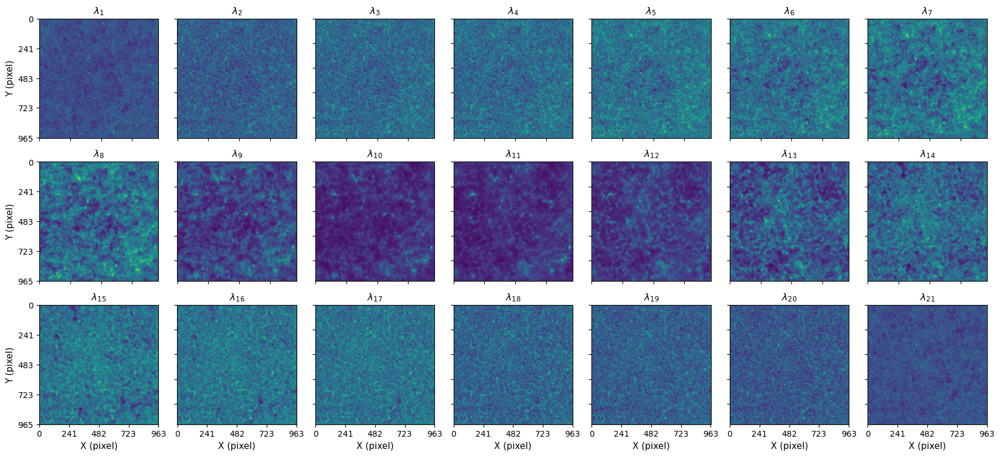

In [7]:
# Call the 'plot_data' function from the 'utils' module to plot the images in the 'cube'
# with their corresponding wavelength labels 'wl_lbls'.
# Uncomment to save the plot
plot_data(dataset=cube, num_columns=7,
          labels=wl_lbls, tick_size=10,
          title_size=12, axis_size=11,
#          path=FINAL_IMAGES, img_name='solar_dataset',
          hspace=0.2, wspace=0.1)

In [61]:
cube.shape

(21, 966, 964)

In [8]:
# Assuming that "dataset" is a 3D array containing images
# Initialize Seaborn's default style settings for the plot
seaborn.set()  # Uncomment to apply default Seaborn style settings
seaborn.set_theme()  # Uncomment to apply the default Seaborn theme

# Plot the 3D cube structure from the tensor 'cube_tensor'
# First, remove any singleton dimensions with 'squeeze' and convert it to a NumPy array
# Uncomment to plot
# plot_cube(dataset=cube, path=FINAL_IMAGES, img_name='cube_3d')

# Reset the plotting style to the original matplotlib style after using Seaborn
# This ensures that Seaborn's style settings are only applied to this specific plot
seaborn.reset_orig()

In [9]:
cero = get_experiment_data(cube, [0])
siete = get_experiment_data(cube, [7])
diciseis = get_experiment_data(cube, [16])

eg_im = [cero, siete, diciseis]
eg_labels = ['$\\lambda_{{{1}}}$', '$\\lambda_{{{8}}}$', '$\\lambda_{{{17}}}$']

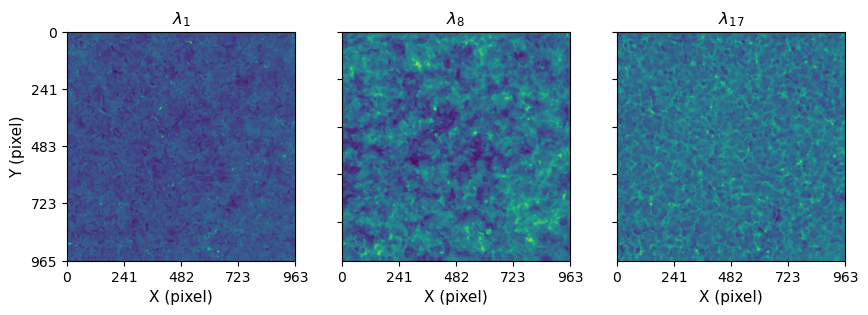

In [10]:
eg_im_ = torch.cat(eg_im, dim=0).squeeze().numpy()

# Uncomment to save the plot

plot_data(eg_im_, num_columns=3,
          labels=eg_labels, tick_size=10,
          title_size=12, axis_size=11,
          # path=FINAL_IMAGES, img_name='intro_3_solar',
          hspace=0.2, wspace=0.1)

In [23]:
# Crear la figura y los ejes
fig, ax = plt.subplots()
ax.imshow(cero.squeeze().numpy())
plt.show()

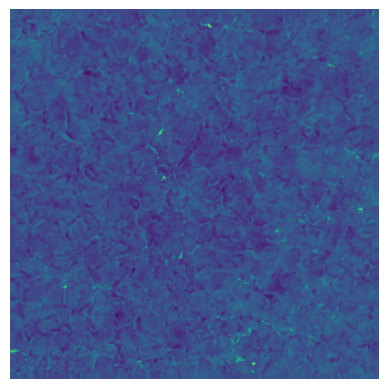

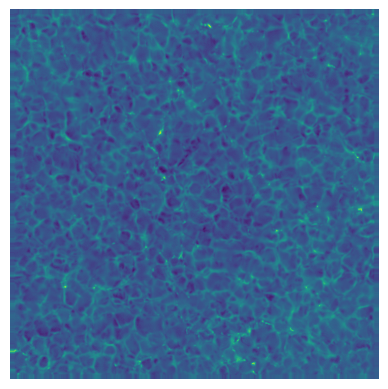

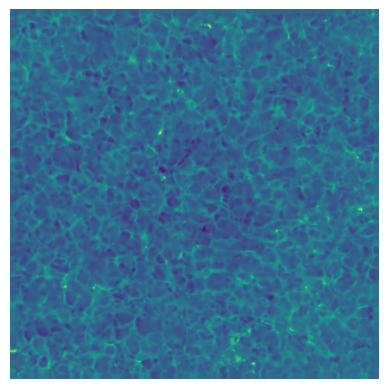

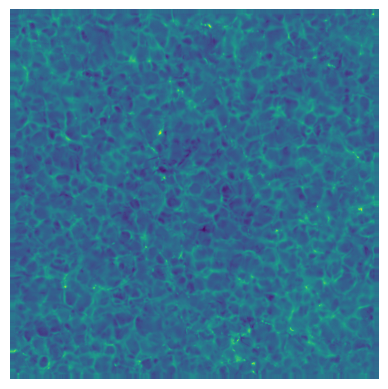

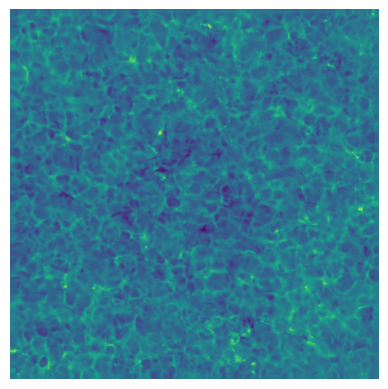

...

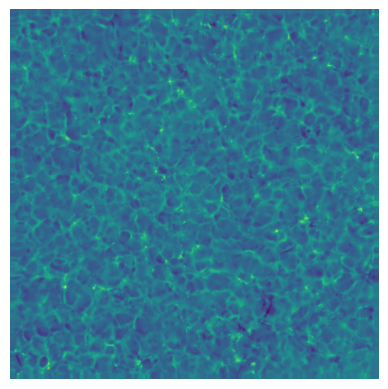

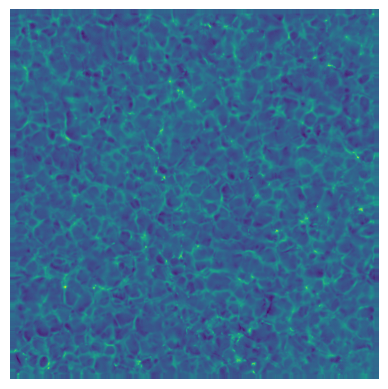

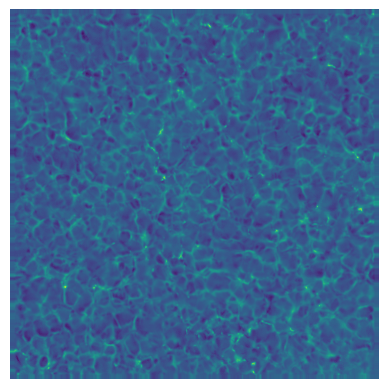

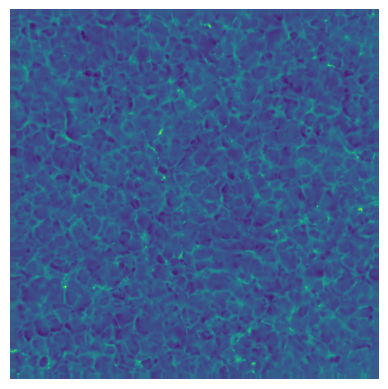

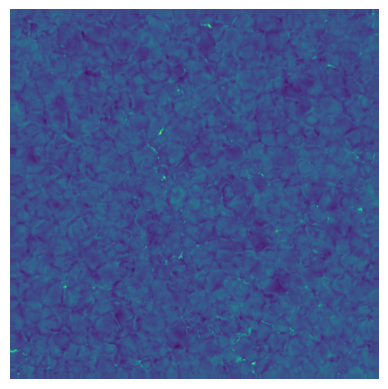

In [47]:

for i in range(21):
    im = get_experiment_data(cube, [i])
    # Crear la figura y los ejes
    fig, ax = plt.subplots()
    ax.imshow(im.squeeze())

    # Ocultar los ejes
    ax.axis('off')

    # Guardar la imagen en un archivo
    plt.savefig(f'{SOLAR_IMAGES}{i+1}', bbox_inches='tight', pad_inches=0)
    
    # Mostrar la imagen
    plt.show()

### SIREN 2D 

#### Load dics

In [21]:
siren_dic_10 = torch.load(MODELS_PATH + 'SIREN2D/0_DIC_SIREN2D_10.0.pth',
                          map_location=torch.device('cpu'))
siren_dic_30 = torch.load(MODELS_PATH + 'SIREN2D/1_DIC_SIREN2D_30.0.pth',
                          map_location=torch.device('cpu'))
siren_dic_50 = torch.load(MODELS_PATH + 'SIREN2D/2_DIC_SIREN2D_50.0.pth',
                          map_location=torch.device('cpu'))
siren_dic_100 = torch.load(MODELS_PATH + 'SIREN2D/3_DIC_SIREN2D_100.0.pth',
                           map_location=torch.device('cpu'))

sirendics = {}
sirendics['$\\omega_{{{0}}}$ = 10'] = siren_dic_10
sirendics['$\\omega_{{{0}}}$ = 30'] = siren_dic_30
sirendics['$\\omega_{{{0}}}$ = 50'] = siren_dic_50
sirendics['$\\omega_{{{0}}}$ = 100'] = siren_dic_100

#### SIREN Metrics

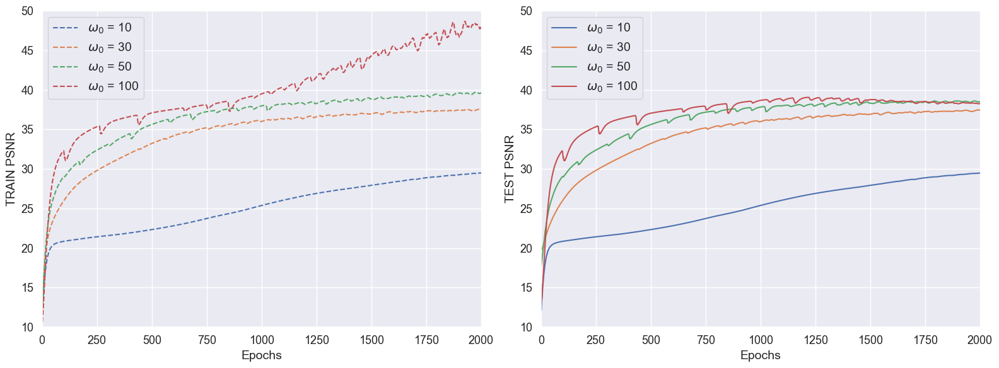

|               |   $\omega_{{{0}}}$ = 10 |   $\omega_{{{0}}}$ = 30 |   $\omega_{{{0}}}$ = 50 |   $\omega_{{{0}}}$ = 100 |
|:--------------|------------------------:|------------------------:|------------------------:|-------------------------:|
| Entrenamiento |                   29.5  |                   37.45 |                   39.66 |                    48.11 |
| Prueba        |                   29.48 |                   37.33 |                   38.52 |                    38.32 |

In [22]:
figura = plot_metrics(epochs=2000, dics=sirendics, ylimits=[(10, 50), (10, 50)],
                      metrics=['psnr', 'test_psnr'],
                      y_labels=['TRAIN PSNR', 'TEST PSNR'],
                      filas=1, columnas=2, w=16, h=6,
                      path=FINAL_IMAGES, img_name='siren2D_metrics',
                      axis_font_size=14, title_font_size=14, 
                      legend_font_size=14, tick_font_size=13)

import pandas as pd
# Crear un diccionario para almacenar los valores de PSNR
data = {
    'ω': [],
    'Entrenamiento': [],
    'Prueba': []
}

# Añadir una entrada para cada omega con los valores de PSNR
for k in sirendics:
    data['ω'].append(f'{k}')
    data['Entrenamiento'].append(sirendics[k]['psnr'][-1])  # Asumiendo que quieres el último valor de PSNR
    data['Prueba'].append(sirendics[k]['test_psnr'][-1])  # Asumiendo que quieres el último valor de val_psnr

# Convertir el diccionario a un DataFrame
df = pd.DataFrame(data)

# Transponer el DataFrame y establecer 'ω' como el índice
df = df.set_index('ω').T

# Redondear los valores a dos decimales
df = df.round(2)

# Convierte el DataFrame a Markdown
df_md = df.to_markdown()

# Muestra el DataFrame como Markdown
display(Markdown(df_md))

#### SIREN 2D Generated images

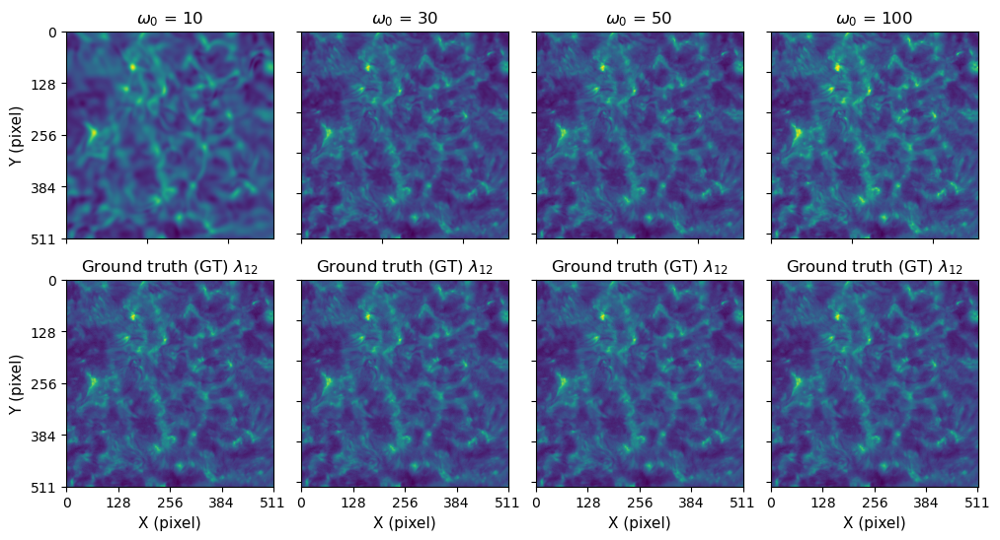

In [23]:
# Initialize empty lists to store the best generated images and their corresponding labels
best = []
labels = []

# Loop through the dictionary containing the output information for each Fourier feature mapping type
for i, s in enumerate(sirendics):
    # Append the best generated image for the current SIREN model to the 'best' list
    best.append(sirendics[s]['best_test_generated'].detach().cpu())
    # Append the label (SIREN omega) to the 'labels' list
    labels.append(f"{s}")

# Append the ground truth image to the 'best' list
for i in range(4):
    best.append(siren_dic_10['config']['GT_IMG'])
    # Append the label 'Ground truth (GT)' to the 'labels' list
    labels.append('Ground truth (GT) $\\lambda_{{{12}}}$')

# Concatenate all the best generated images and the ground truth image along dimension 0
# Then, remove the singleton dimensions and convert the tensor to a NumPy array
generated_images = torch.cat(best, dim=0).squeeze().numpy()

# Utilizes the 'plot_data' function from the 'utils' module to display the images.
# The images are arranged in a grid with 3 columns, and each image is labeled according to the 'labels' list.
plot_data(generated_images, num_columns=4, 
          labels=labels, tick_size=10, 
          title_size=12, axis_size=11, 
          path=FINAL_IMAGES, img_name='siren2D_imgs',
          hspace=0.2, wspace=0.1)

#### Check SIREN model

In [24]:
siren_model_30 = NeuralFieldSiren(in_features=3, out_features=1, hidden_features=256,
                               first_omega_0=30., hidden_omega_0=30.,
                               hidden_layers=3, outermost_linear=True)
siren_model_30.load_state_dict(torch.load(MODELS_PATH + 'SIREN2D/1_MODEL_SIREN2D_30.0.pth',
                                       map_location=torch.device('cpu')))

<All keys matched successfully>

In [25]:
siren_model_30.eval()
siren_30 = siren_model_30(siren_dic_30['config']['COORDS_VAL']).detach()

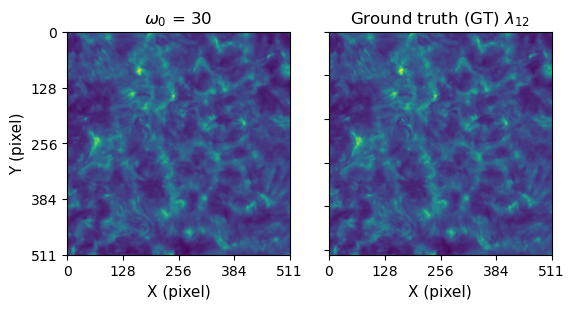

In [26]:
gen = []
lbls = []

gen.append(siren_30)
gen.append(siren_dic_10['config']['GT_IMG'])
lbls.append('$\\omega_{{{0}}}$ = 30')
lbls.append('Ground truth (GT) $\\lambda_{{{12}}}$')

generated_images = torch.cat(gen, dim=0).squeeze().numpy()

# Uncomment to save the plot
plot_data(dataset=generated_images, num_columns=7,
          labels=lbls, tick_size=10,
          title_size=12, axis_size=11,
          path=FINAL_IMAGES, img_name='siren2D_checked_model',
          hspace=0.2, wspace=0.1)

### Forier features 2D

#### Load dics

In [27]:
ff_dic_none = torch.load(MODELS_PATH + 'FF2D/0_DIC_FF2D_none.pth',
                         map_location=torch.device('cpu'))
ff_dic_basic = torch.load(MODELS_PATH + 'FF2D/1_DIC_FF2D_basic.pth',
                          map_location=torch.device('cpu'))
ff_dic_1 = torch.load(MODELS_PATH + 'FF2D/2_DIC_FF2D_gauss_1.0.pth',
                      map_location=torch.device('cpu'))
ff_dic_10 = torch.load(MODELS_PATH + 'FF2D/3_DIC_FF2D_gauss_10.0.pth',
                       map_location=torch.device('cpu'))
ff_dic_100 = torch.load(MODELS_PATH + 'FF2D/4_DIC_FF2D_gauss_100.0.pth',
                        map_location=torch.device('cpu'))

ffdics = {}
ffdics['none'] = ff_dic_none
ffdics['basic'] = ff_dic_basic
ffdics['σ = 1'] = ff_dic_1
ffdics['σ = 10'] = ff_dic_10
ffdics['σ = 100'] = ff_dic_100

#### Fourier features Metrics

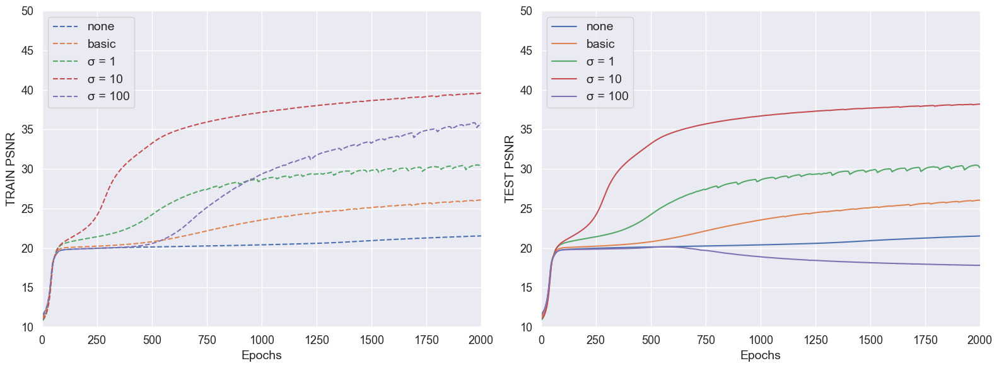

|               |   none |   basic |   σ = 1 |   σ = 10 |   σ = 100 |
|:--------------|-------:|--------:|--------:|---------:|----------:|
| Entrenamiento |  21.55 |   26.05 |   29.92 |    39.63 |     36.03 |
| Prueba        |  21.55 |   26.03 |   30.09 |    38.22 |     17.85 |

In [28]:
figura = plot_metrics(epochs=2000, dics=ffdics, ylimits=[(10, 50), (10, 50)],
                      metrics=['psnr', 'test_psnr'],
                      y_labels=['TRAIN PSNR', 'TEST PSNR'],
                      filas=1, columnas=2, w=16, h=6,
                      path=FINAL_IMAGES, img_name='ff2D_metrics',
                      axis_font_size=14, title_font_size=14, 
                      legend_font_size=14, tick_font_size=13)

data = {
    'Mapeo': [],
    'Entrenamiento': [],
    'Prueba': []
}

for k in ffdics:
    data['Mapeo'].append(f'{k}')
    data['Entrenamiento'].append(ffdics[k]['psnr'][-1])  
    data['Prueba'].append(ffdics[k]['test_psnr'][-1])  

df = pd.DataFrame(data)

df = df.set_index('Mapeo').T

df = df.round(2)


df_md = df.to_markdown()

display(Markdown(df_md))

#### Fourier features 2D Generated images

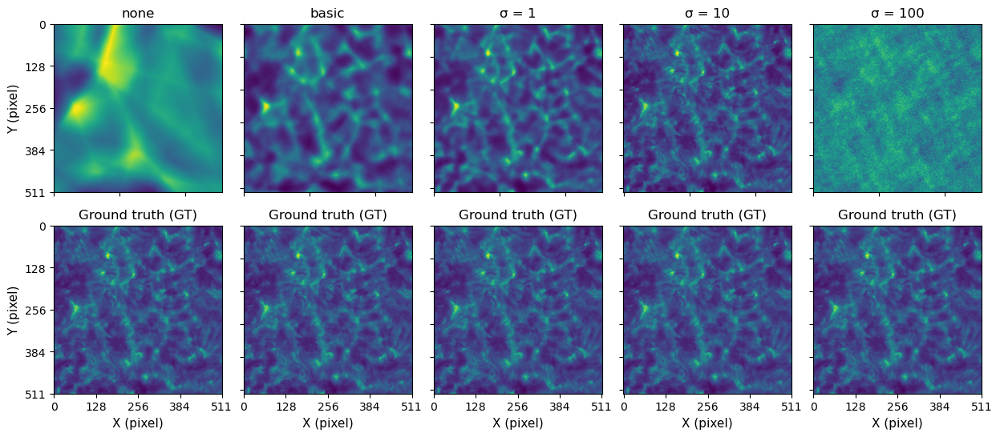

In [29]:
# Initialize empty lists to store the best generated images and their corresponding labels
best = []
labels = []

# Loop through the dictionary containing the output information for each Fourier feature mapping type
for s in ffdics:
    # Append the best generated image for the current SIREN model to the 'best' list
    best.append(ffdics[s]['best_test_generated'].detach().cpu())
    # Append the label (SIREN omega) to the 'labels' list
    labels.append(s)

# Append the ground truth image to the 'best' list
for i in range(5):
    best.append(ff_dic_none['config']['GT_IMG'])
    # Append the label 'Ground truth (GT)' to the 'labels' list
    labels.append('Ground truth (GT)')

# Concatenate all the best generated images and the ground truth image along dimension 0
# Then, remove the singleton dimensions and convert the tensor to a NumPy array
generated_images = torch.cat(best, dim=0).squeeze().numpy()

# Utilizes the 'plot_data' function from the 'utils' module to display the images.
# The images are arranged in a grid with 3 columns, and each image is labeled according to the 'labels' list.
plot_data(generated_images, num_columns=5,
          labels=labels, tick_size=10, 
          title_size=12, axis_size=11, 
          path=FINAL_IMAGES, img_name='ff2D_images',
          hspace=0.2, wspace=0.1)

#### Check Fourier features 2D model

In [30]:
m = 128
ff_model_10 = NeuralFieldFF(input_size=(2*m), hidden_layers=3)
ff_model_10.load_state_dict(torch.load(MODELS_PATH + 'FF2D/3_MODEL_FF2D_gauss_10.0.pth',
                                    map_location=torch.device('cpu')))

<All keys matched successfully>

In [31]:
ff_model_10.eval()
ff_coords = fourier_mapping(x=ff_dic_10['config']['COORDS_VAL'], B=ff_dic_10['B'])
ff_10 = ff_model_10(ff_coords).detach()

In [32]:
gen = []
lbls = []

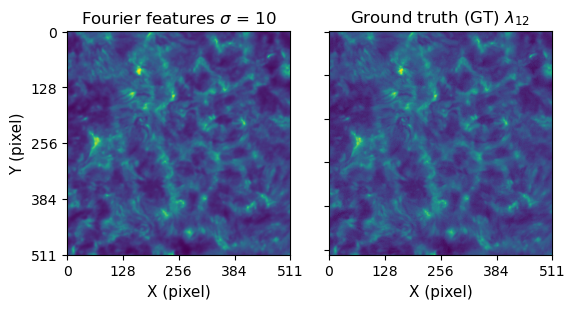

In [33]:
gen.append(ff_10)
gen.append(ff_dic_10['config']['GT_IMG'])
lbls.append('Fourier features $\\sigma$ = 10')
lbls.append('Ground truth (GT) $\\lambda_{{{12}}}$')

generated_images = torch.cat(gen, dim=0).squeeze().numpy()

# Uncomment to save the plot
plot_data(dataset=generated_images, num_columns=7,
          labels=lbls, tick_size=10,
          title_size=12, axis_size=11,
          path=FINAL_IMAGES, img_name='ff2D_checked_model',
          hspace=0.2, wspace=0.1)

### Comaparing 2D models

#### Images

In [34]:
gen.append(siren_30)
gen.append(siren_dic_30['config']['GT_IMG'])
lbls.append('SIREN $\\omega_{{{0}}}$ = 30')
lbls.append('Ground truth (GT) $\\lambda_{{{12}}}$')

In [35]:
generated_images = torch.cat(gen, dim=0).squeeze().numpy()

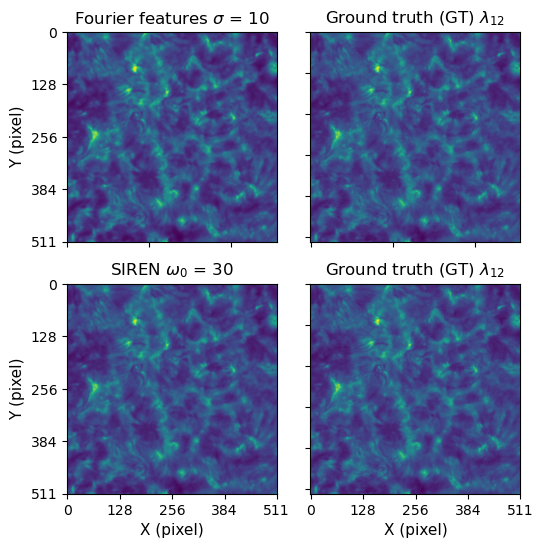

In [36]:
plot_data(dataset=generated_images, num_columns=2,
          labels=lbls, tick_size=10,
          title_size=12, axis_size=11,
          path=FINAL_IMAGES, img_name='comparing_2D_models',
          hspace=0.2, wspace=0.1)

#### Data

In [37]:
dics = {}

dics['ff σ = 10'] = ff_dic_10
dics['SIREN ω = 30'] = siren_dic_30

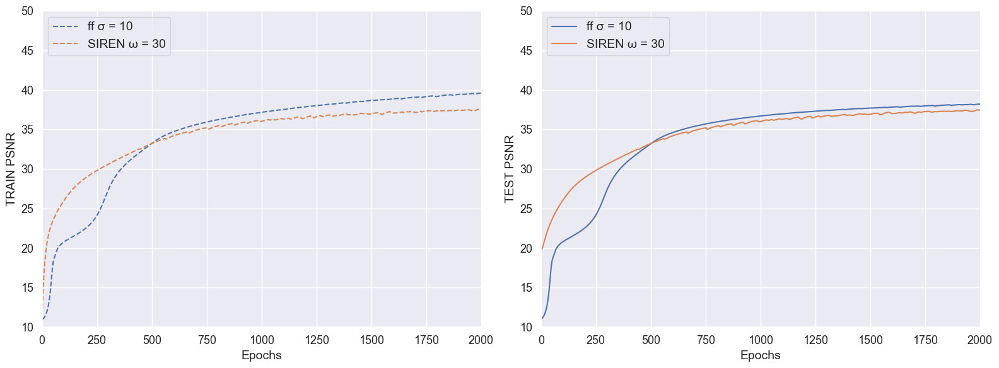

In [38]:
plot_metrics(epochs=2000, dics=dics, ylimits=[(10, 50), (10, 50)],
             metrics=['psnr', 'test_psnr'],
             y_labels=['TRAIN PSNR', 'TEST PSNR'],
             filas=1, columnas=2, w=16, h=6,
             path=FINAL_IMAGES, img_name='comparing_2D_metrics',
             axis_font_size=14, title_font_size=14, 
             legend_font_size=14, tick_font_size=13);

In [39]:
# Código para mostrar el vídeo en Jupyter Notebook (opcional)
from IPython.display import HTML
from base64 import b64encode

mp4 = open(FINAL_VIDEOS + 'FF_learning_annotated.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Super-resolution models

### SIREN

#### Load dics 

In [40]:
dic_30 = torch.load(MODELS_PATH + 'SUPERSIREN/0_DIC_SUPERSIREN_30.0.pth', map_location=torch.device('cpu'))
dic_50 = torch.load(MODELS_PATH + 'SUPERSIREN/1_DIC_SUPERSIREN_50.0.pth', map_location=torch.device('cpu'))

dics_siren_3D = {}
dics_siren_3D[f"$\\omega_0$ = 30"] = dic_30
dics_siren_3D[F"$\\omega_0$ = 50"] = dic_50

#### SIREN Metrics

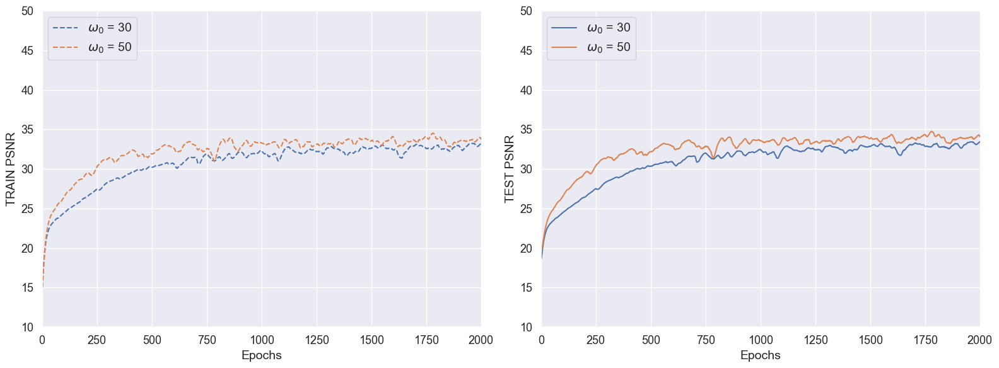

In [41]:
plot_metrics(epochs=2000, dics=dics_siren_3D, ylimits=[(10, 50), (10, 50)],
             metrics=['psnr', 'test_psnr'],
             y_labels=['TRAIN PSNR', 'TEST PSNR'],
             filas=1, columnas=2, w=16, h=6,
             path=FINAL_IMAGES, img_name='sirenSR_metrics',
             axis_font_size=14, title_font_size=14,
             legend_font_size=14, tick_font_size=13);

In [42]:
data = {
    '': [],
    'Entrenamiento': [],
    'Prueba': []
}


for k in dics_siren_3D:
    data[''].append(k)
    data['Entrenamiento'].append(max(dics_siren_3D[k]['psnr']))
    data['Prueba'].append(max(dics_siren_3D[k]['test_psnr']))


df = pd.DataFrame(data)


df = df.set_index('').T


df = df.round(2)


# Convierte el DataFrame a Markdown
df_md = df.to_markdown()

# Muestra el DataFrame como Markdown
display(Markdown(df_md))

|               |   $\omega_0$ = 30 |   $\omega_0$ = 50 |
|:--------------|------------------:|------------------:|
| Entrenamiento |             33.5  |             34.84 |
| Prueba        |             33.79 |             35.06 |

#### Check SIREN SR model

In [43]:
# Load model SR SIREN omega = 30.0
siren_model_30_SR = NeuralFieldSiren(in_features=3, out_features=1, hidden_features=256,
                            first_omega_0=30, hidden_omega_0=30,
                            hidden_layers=3, outermost_linear=True)
siren_model_30_SR.load_state_dict(torch.load(MODELS_PATH + 'SUPERSIREN/0_MODEL_SUPERSIREN_30.0.pth',
                                       map_location=torch.device('cpu')))

# Load model SR SIREN omega = 50.0
siren_model_50_SR = NeuralFieldSiren(in_features=3, out_features=1, hidden_features=256,
                            first_omega_0=50, hidden_omega_0=50,
                            hidden_layers=3, outermost_linear=True)
siren_model_50_SR.load_state_dict(torch.load(MODELS_PATH + 'SUPERSIREN/1_MODEL_SUPERSIREN_50.0.pth',
                                       map_location=torch.device('cpu')))

<All keys matched successfully>

In [44]:
coords = dic_30['config']['COORDS_VAL']
original = dic_30['config']['GT_IMG']

In [45]:
indices = [1, 4, 11, 17]
selected_coords = [coords[i].unsqueeze(0) for i in indices]
original_images = [original[i].unsqueeze(0) for i in indices]

labels_generated_30 = [f"generated $\\omega_{{{0}}}$ = 30 $\\lambda_{{{index + 1}}}$" for index in indices]
labels_generated_50 = [f"generated $\\omega_{{{0}}}$ = 50 $\\lambda_{{{index + 1}}}$" for index in indices]
labels_original = [f"original (GT) $\\lambda_{{{index + 1}}}$" for index in indices]

In [46]:
# Pasar cada imagen en selected_images a través del modelo
generated_images_30 = [siren_model_30_SR(coord) for coord in selected_coords]

# Pasar cada imagen en selected_images a través del modelo
generated_images_50 = [siren_model_50_SR(coord) for coord in selected_coords]

In [47]:
# Concatenar los tensores de imágenes generadas y originales
all_images_30 = torch.cat(generated_images_30 + generated_images_50 + original_images, dim=0)

# Concatenar las etiquetas generadas y originales
all_labels = labels_generated_30 + labels_generated_50 + labels_original

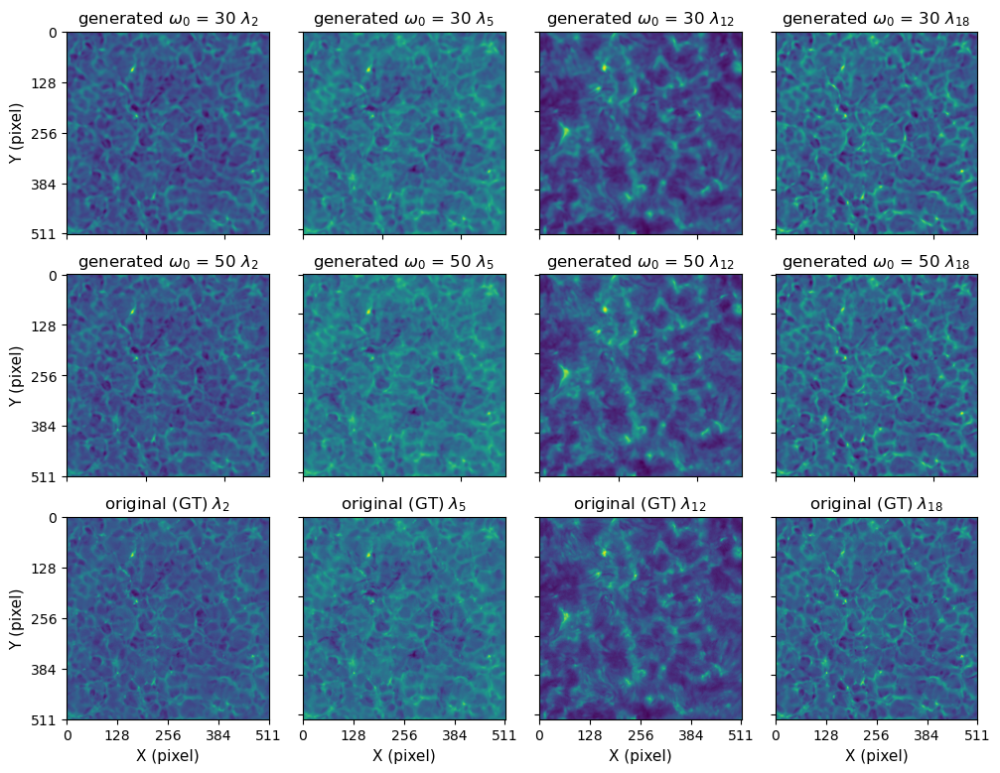

In [48]:
ds = all_images_30.squeeze().detach().cpu().numpy()

# Uncomment to save the plot
plot_data(dataset=ds, num_columns=4,
          labels=all_labels, tick_size=10,
          title_size=12, axis_size=11,
          path=FINAL_IMAGES, img_name='sirenSR_checked_model',
          hspace=0.2, wspace=0.1)

### Fourier features

#### Load dics 

In [49]:
# learning rate for all models lr=0.002
dics_ff_3D = {}
dic_256 = '3_DIC_SUPERFF_tensor-256-0.002.pth'
dic_64 = '2_DIC_SUPERFF_tensor-64-0.002.pth'
dics_ff_3D['σ = 0.8 - k = 512'] = torch.load(MODELS_PATH + 'SUPERFF/1_DIC_SUPERFF_0.8-256-0.002.pth', map_location=torch.device('cpu'))
dics_ff_3D['σ = 0.8 - k = 128'] = torch.load(MODELS_PATH + 'SUPERFF/0_DIC_SUPERFF_0.8-64-0.002.pth', map_location=torch.device('cpu'))
dics_ff_3D['σ = [10,10,0.8] - k = 512'] = torch.load(f'{MODELS_PATH}SUPERFF/{dic_256}', map_location=torch.device('cpu'))
dics_ff_3D['σ = [10,10,0.8] - k = 128'] = torch.load(f'{MODELS_PATH}SUPERFF/{dic_64}', map_location=torch.device('cpu'))

#### Fourier features Metrics

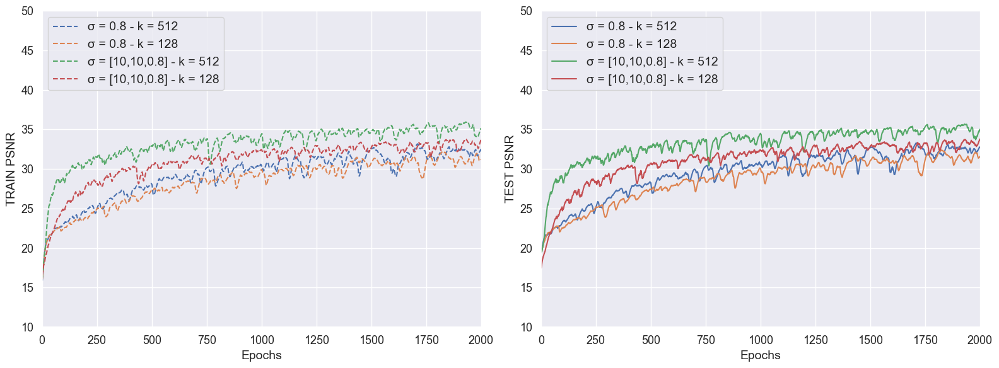

In [50]:
plot_metrics(epochs=2000, dics=dics_ff_3D, ylimits=[(10, 50), (10, 50)],
             metrics=['psnr', 'test_psnr'],
             y_labels=['TRAIN PSNR', 'TEST PSNR'],
             filas=1, columnas=2, w=16, h=6,
             # path='ff3D_metrics',
             axis_font_size=14, title_font_size=14,
             legend_font_size=14, tick_font_size=13);

In [51]:
data = {
    '': [],
    'Entrenamiento': [],
    'Prueba': []
}


for k in dics_ff_3D:
    data[''].append(k)
    data['Entrenamiento'].append(max(dics_ff_3D[k]['psnr']))
    data['Prueba'].append(max(dics_ff_3D[k]['test_psnr']))


df = pd.DataFrame(data)


df = df.set_index('').T


df = df.round(2)


# Convierte el DataFrame a Markdown
df_md = df.to_markdown()

# Muestra el DataFrame como Markdown
display(Markdown(df_md))

|               |   σ = 0.8 - k = 512 |   σ = 0.8 - k = 128 |   σ = [10,10,0.8] - k = 512 |   σ = [10,10,0.8] - k = 128 |
|:--------------|--------------------:|--------------------:|----------------------------:|----------------------------:|
| Entrenamiento |               33.61 |               32.47 |                       36.46 |                       34.34 |
| Prueba        |               33.68 |               32.73 |                       36.08 |                       34.42 |

#### Check Fourier features SR model

In [52]:
tensor_256_model = '3_MODEL_SUPERFF_tensor-256-0.002.pth'
model_ff_512 = NeuralFieldFF(input_size=512, hidden_layers=3)
model_ff_512.load_state_dict(torch.load(f'{MODELS_PATH}SUPERFF/{tensor_256_model}', 
                                        map_location=torch.device('cpu')))

<All keys matched successfully>

In [53]:
tensor_64_model = '2_MODEL_SUPERFF_tensor-64-0.002.pth'
model_ff_128 = NeuralFieldFF(input_size=128, hidden_layers=3)
model_ff_128.load_state_dict(torch.load(f'{MODELS_PATH}SUPERFF/{tensor_64_model}', 
                                        map_location=torch.device('cpu')))

<All keys matched successfully>

In [54]:
for k in dics_ff_3D:
    print(f"{k}: {dics_ff_3D[k]['B'].shape}")

σ = 0.8 - k = 512: torch.Size([256, 3])
σ = 0.8 - k = 128: torch.Size([64, 3])
σ = [10,10,0.8] - k = 512: torch.Size([256, 3])
σ = [10,10,0.8] - k = 128: torch.Size([64, 3])


In [55]:
ff_coords_512 = [fourier_mapping(x=coord, B=dics_ff_3D['σ = [10,10,0.8] - k = 512']['B']) for coord in selected_coords]
ff_coords_128 = [fourier_mapping(x=coord, B=dics_ff_3D['σ = [10,10,0.8] - k = 128']['B']) for coord in selected_coords]

# Pasar cada imagen en selected_images a través del modelo
generated_images_512 = [model_ff_512(coord_) for coord_ in ff_coords_512]

# Pasar cada imagen en selected_images a través del modelo
generated_images_128 = [model_ff_128(coord_) for coord_ in ff_coords_128]

labels_generated_512 = [f"$\\sigma$ = tensor; k=512 $\\lambda_{{{index + 1}}}$" for index in indices]
labels_generated_128 = [f"$\\sigma$ = tensor; k=128 $\\lambda_{{{index + 1}}}$" for index in indices]

# Concatenar los tensores de imágenes generadas y originales
all_images_t = torch.cat(generated_images_512 + generated_images_128 + original_images, dim=0)

# Concatenar las etiquetas generadas y originales
all_labels = labels_generated_512 + labels_generated_128 + labels_original

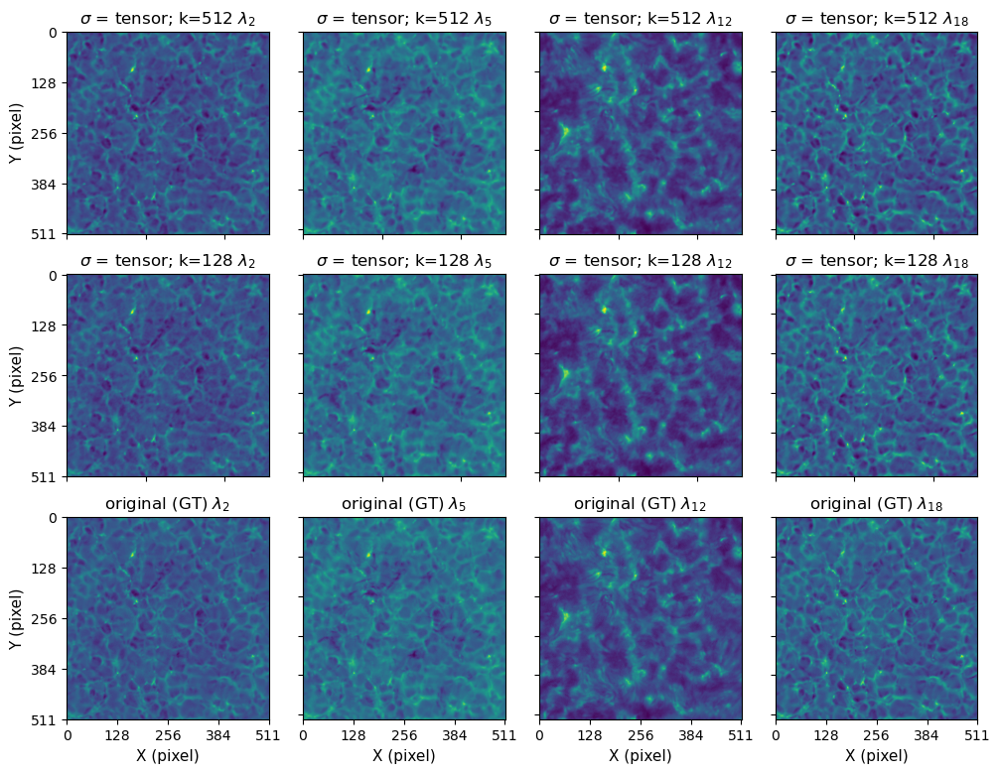

In [56]:
ds = all_images_t.squeeze().detach().cpu().numpy()

# Uncomment to save the plot
plot_data(dataset=ds, num_columns=4,
          labels=all_labels, tick_size=10,
          title_size=12, axis_size=11,
          path=FINAL_IMAGES, img_name='ffSR_checked_model',
          hspace=0.2, wspace=0.1)

### Comaparing SR models

#### Metrics

In [57]:
dic_super = {}

dic_super[f'SIREN - $\\omega_0=50$'] = dic_50
dic_super[f'SIREN - $\\omega_0=30$'] = dic_30
dic_super['Fourier features - σ = [10,10,0.8] - k = 512'] = dics_ff_3D['σ = [10,10,0.8] - k = 512']
dic_super['Fourier features - σ = [10,10,0.8] - k = 128'] = dics_ff_3D['σ = [10,10,0.8] - k = 128']

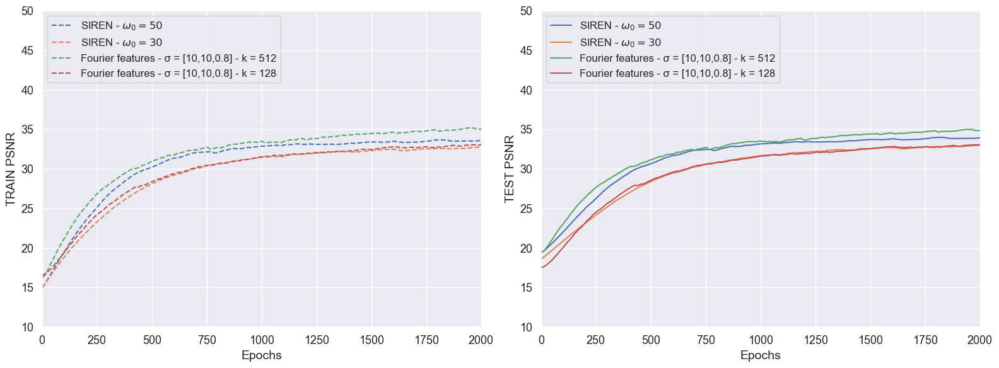

In [58]:
plot_metrics(epochs=2000, dics=dic_super, ylimits=[(10, 50), (10, 50)],
             metrics=['psnr', 'test_psnr'],
             y_labels=['TRAIN PSNR', 'TEST PSNR'],
             filas=1, columnas=2, w=16, h=6,
             # path='3D_metrics', 
             smooth_value=0.994,
             axis_font_size=14, title_font_size=14,
             legend_font_size=12, tick_font_size=13);

## Super-resolution

###  Interpolation funtion

In [59]:
# Usamos las coordenadas y el modelo model50
def superresolution(X, model, ff=False, B=None, inter=8):
    images = []
    image_lbls = []
    for i, image in tqdm(enumerate(X)):
        image = image.unsqueeze(0)
        generate = model(image)
        generate = generate.squeeze().detach().cpu().numpy()
        images.append(generate)
        image_lbls.append(f'$\\lambda_{{{i + 1}}}$' )
        if i < (len(coords)-1):
            for f in np.linspace(0.1, 0.9, inter): #np.arange(0.1, 1.0, 0.1):
                # Calculo la parte fraccionaria y la parte entera de z_intermediate
                z_intermediate = i + f
                z_floor = int(np.floor(z_intermediate))
                z_frac = z_intermediate - z_floor
                # Realizo la interpolación lineal entre las mallas en los niveles z_floor y z_floor+1
                intermediate_mesh = (1 - z_frac) * coords[z_floor] + z_frac * coords[z_floor + 1]
                intermediate_mesh = intermediate_mesh.unsqueeze(0)
                if ff:
                    intermediate_map = fourier_mapping(intermediate_mesh, B)
                else:
                    intermediate_map = intermediate_mesh
                intermediate = model(intermediate_map)
                intermediate = intermediate.squeeze().detach().cpu().numpy()
                images.append(intermediate)
                z_rounded = round(z_intermediate, 1)  # Redondea a 1 decimal
                image_lbls.append(f'$\\lambda_{{{z_rounded + 1}}}$' )
    return images, image_lbls

In [60]:
superresolution_images = {}

### Super-resolution SIREN 

In [61]:
superresolution_images['siren_30'], _ = superresolution(coords, siren_model_30_SR)

0it [00:00, ?it/s]

In [62]:
superresolution_images['siren_50'], _ = superresolution(coords, siren_model_30_SR)

0it [00:00, ?it/s]

### Super-resolution Fourier features 

In [67]:
B_512 = dics_ff_3D['σ = [10,10,0.8] - k = 512']['B']
B_128 = dics_ff_3D['σ = [10,10,0.8] - k = 128']['B']

In [68]:
X = fourier_mapping(x=coords, B=B_512)

In [70]:
Y = fourier_mapping(x=coords, B=B_128)

In [71]:
superresolution_images['ff_128_s_vector'], _ = superresolution(X=Y, model=model_ff_128, ff=True, B=B_128)

0it [00:00, ?it/s]

In [72]:
superresolution_images['ff_512_s_vector'], superresolution_images['lbls'] = superresolution(X=X, model=model_ff_512, ff=True, B=B_512)

0it [00:00, ?it/s]

In [90]:
superresolution_images['ff_512_s_vector_16'], superresolution_images['lbls_16'] = superresolution(X=X, model=model_ff_512, ff=True, B=B_512, inter=16)

0it [00:00, ?it/s]

In [100]:
superresolution_images['ff_512_s_vector_24'], superresolution_images['lbls_24'] = superresolution(X=X, model=model_ff_512, ff=True, B=B_512, inter=24)

0it [00:00, ?it/s]

In [101]:
# Save images dictionary to a .pth file
torch.save(superresolution_images, FINAL_IMAGES + 'superresolution_8.pth')

## Results

### Load images

In [5]:
superresolution_images = torch.load(FINAL_IMAGES + 'superresolution_8.pth', map_location=torch.device('cpu'))

### Evolution of the mean pixel intensity

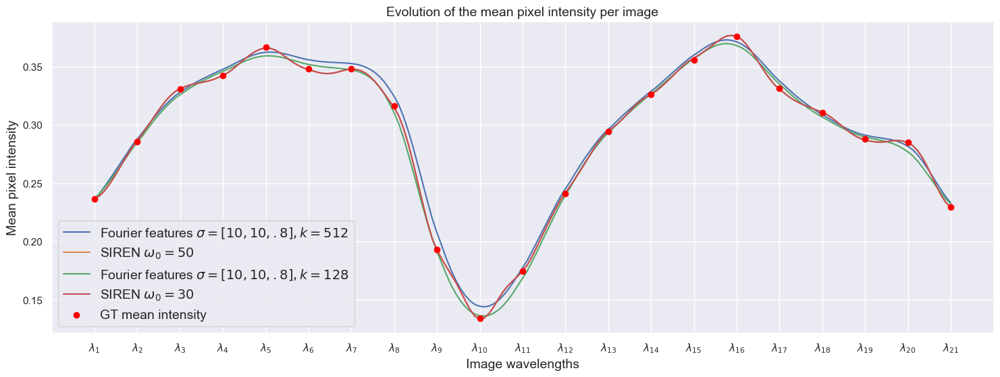

In [75]:
mean_f_512 = [np.mean(image) for image in superresolution_images['ff_512_s_vector']]
mean_s_50 = [np.mean(image) for image in superresolution_images['siren_50']]
mean_f_128 = [np.mean(image) for image in superresolution_images['ff_128_s_vector']]
mean_s_30 = [np.mean(image) for image in superresolution_images['siren_30']]

# Valores medios para los puntos específicos
mean_gt = [np.mean(image) for image in original.squeeze().detach().numpy()]

# Generar posiciones para la serie mean_gt
positions_gt = np.linspace(0, 180, 21).astype(int)

seaborn.set()
seaborn.set_theme()

# Configure the figure and axes
plt.figure(figsize=(18, 6))

# Plot each series of mean values as lines
plt.plot(mean_f_512, linestyle='-', label=r'Fourier features $\sigma=[10,10,.8], k=512$')
plt.plot(mean_s_50, linestyle='-', label=r'SIREN $\omega_0=50$')
plt.plot(mean_f_128, linestyle='-', label=r'Fourier features $\sigma=[10,10,.8], k=128$')
plt.plot(mean_s_30, linestyle='-', label=r'SIREN $\omega_0=30$')

# Plot the mean_gt series at the corresponding positions
# plt.plot(positions_gt, mean_gt, marker='x', linestyle='-', color='red', label='GT mean intensity')
plt.scatter(positions_gt, mean_gt, color='red', label='GT mean intensity', zorder=5)

# Add title and labels
plt.title('Evolution of the mean pixel intensity per image', fontsize=14)
plt.xlabel('Image wavelengths', fontsize=14)
plt.ylabel('Mean pixel intensity', fontsize=14)

# Set the x-axis ticks and labels
plt.xticks(ticks=positions_gt, labels=[f'$\lambda_{{{index}}}$' for index in range(1, 22)])

# Show the legend
plt.legend(fontsize=14)

# Add a grid for easier reading
plt.grid(True)

path='mean_evolution'

# Guarda el gráfico en un archivo PNG antes de mostrarlo
plt.savefig(f'{FINAL_IMAGES}{path}.png', dpi=150)

# Show the plot
plt.show()

# Reset the plot settings to default
plt.rcdefaults()

### Plot part of volume of the cube with interpolate images

In [78]:
f_512 = superresolution_images['ff_512_s_vector'][72:92:3]
s_50 = superresolution_images['siren_50'][72:92:3]
f_128 = superresolution_images['ff_128_s_vector'][72:92:3]
s_30 = superresolution_images['siren_30'][72:92:3]

lbls = superresolution_images['lbls'][72:92:3]

In [79]:
f_512_stack = np.stack(f_512, axis=0)
s_30_stack = np.stack(s_30, axis=0)
f_128_stack = np.stack(f_128, axis=0)
s_50_stack = np.stack(s_50, axis=0)
# plot_data(f_512_stack, lbls, cmap='viridis', num_columns=7, wspace=0.01, hspace=0.01, tick_size=12, axis_size=14, title_size=14)
# plot_data(s_30_stack, lbls, cmap='viridis', num_columns=7, wspace=0.1, hspace=0.1, tick_size=12, axis_size=14, title_size=14)
# plot_data(f_128_stack, lbls, cmap='viridis', num_columns=7, wspace=0.1, hspace=0.1, tick_size=12, axis_size=14, title_size=14)
# plot_data(s_50_stack, lbls, cmap='viridis', num_columns=7, wspace=0.1, hspace=0.1, tick_size=12, axis_size=14, title_size=14)

In [81]:
img_np = np.ones((512, 512), dtype=np.uint8) * 255

# Convierte el arreglo de NumPy a una imagen PIL en modo 'L' (escala de grises)
img = Image.fromarray(img_np, 'L')

In [82]:
feat = original.squeeze().detach().numpy()
print(feat.shape)
vector_of_gt = [feat[8], img_np, img_np, feat[9], img_np, img_np,feat[10]]


(21, 512, 512)


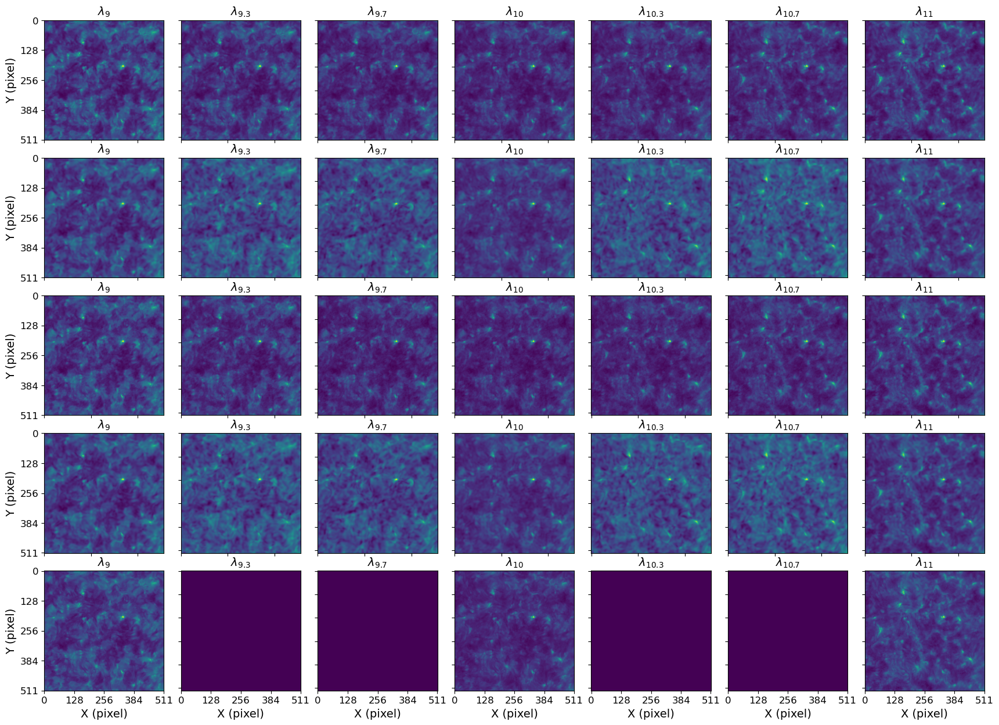

In [83]:
# Concatenar las listas de imágenes en el orden deseado
all_images_list = f_512 + s_30 + f_128 + s_50 + vector_of_gt
all_lbls = lbls + lbls + lbls + lbls + lbls

# Convertir la lista concatenada en un array de NumPy apilando a lo largo de un nuevo eje
all_images_stack = np.stack(all_images_list, axis=0)

plot_data(all_images_stack, all_lbls, cmap='viridis', 
          num_columns=7, 
          wspace=0.1, hspace=0.15, 
          tick_size=12, axis_size=14, title_size=14, 
          path=FINAL_IMAGES, img_name='superresolution_imgs')

### Follow up certain pixels

In [107]:
def draw_red_box_and_save(image, position, save_path, box_size=40):
    """
    Dibuja un cuadro rojo alrededor del píxel especificado en la imagen y guarda la imagen sin ejes.

    Args:
    - image: La imagen (como un array 2D de NumPy).
    - position: La posición (fila, columna) del píxel alrededor del cual se dibujará el cuadro.
    - save_path: Ruta para guardar la imagen resultante.
    - box_size: El tamaño del lado del cuadro en píxeles.
    """
    fig, ax = plt.subplots()
    ax.imshow(image, cmap='viridis')
    ax.axis('off')  # Desactivar los ejes

    # Calcular la esquina superior izquierda del cuadro
    top_left = (position[1] - box_size // 2, position[0] - box_size // 2)

    # Crear un cuadro rojo intenso
    rect = patches.Rectangle(top_left, box_size, box_size, linewidth=2, edgecolor='#FF0000', facecolor='none')
    ax.add_patch(rect)

    # Ajustar el área de la trama y guardar la imagen
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.savefig(save_path, bbox_inches='tight', pad_inches=0)
    plt.close()  # Cerrar la figura para liberar memoria

# Ejemplo de uso
# draw_red_box_and_save(tu_imagen, tu_posicion, 'ruta_para_guardar_la_imagen.png')


In [108]:
import os
from PIL import Image

def load_images_from_folder(folder, prefix):
    images = []
    for filename in os.listdir(folder):
        if filename.startswith(prefix):
            img = Image.open(os.path.join(folder, filename))
            img_array = np.array(img)
            images.append(img_array)
    return images

Mayor variación de intensidad Fourier features 512: (149, 243)
Mayor variación de intensidad SIREN_50: (261, 65)
Mayor variación de intensidad Fourier features 128: (264, 63)
Mayor variación de intensidad SIREN_30: (261, 65)


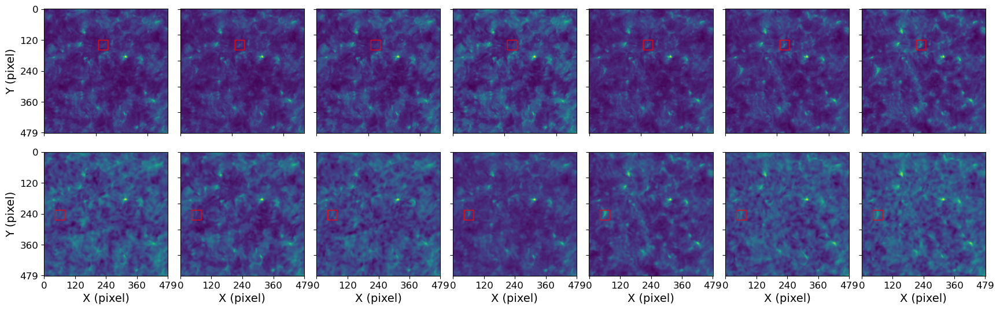

In [109]:
std_devs_ff_512 = np.std(f_512, axis=0)
std_devs_s50 = np.std(s_50, axis=0)
std_devs_ff_128 = np.std(f_128, axis=0)
std_devs_s30 = np.std(s_30, axis=0)

# Encontrar la posición del píxel con la mayor desviación estándar
max_std_dev_position_ff_512 = np.unravel_index(np.argmax(std_devs_ff_512), std_devs_ff_512.shape)
max_std_dev_position_s50 = np.unravel_index(np.argmax(std_devs_s50), std_devs_s50.shape)
max_std_dev_position_ff_128 = np.unravel_index(np.argmax(std_devs_ff_128), std_devs_ff_128.shape)
max_std_dev_position_s30 = np.unravel_index(np.argmax(std_devs_s30), std_devs_s30.shape)


print(f"Mayor variación de intensidad Fourier features 512: {max_std_dev_position_ff_512}")
print(f"Mayor variación de intensidad SIREN_50: {max_std_dev_position_s50}")
print(f"Mayor variación de intensidad Fourier features 128: {max_std_dev_position_ff_128}")
print(f"Mayor variación de intensidad SIREN_30: {max_std_dev_position_s30}")



# Aplicar la función a todas las imágenes en f_512, por ejemplo
for i, image in enumerate(f_512):
    save_path = os.path.join(TEST_RED_SQUARE, f'f_512_img_{i}.png')
    draw_red_box_and_save(image, max_std_dev_position_ff_512, save_path)

# Repetir para s_30 si es necesario
for i, image in enumerate(s_30):
    save_path = os.path.join(TEST_RED_SQUARE, f's_30_img_{i}.png')
    draw_red_box_and_save(image, max_std_dev_position_s30, save_path)

# Cargar todas las imágenes que comienzan con 'f_512_img'
f_512_img = load_images_from_folder(TEST_RED_SQUARE, 'f_512_img')
s_30_img = load_images_from_folder(TEST_RED_SQUARE, 's_30_img')

all_images_red = f_512_img + s_30_img
# Convertir la lista concatenada en un array de NumPy apilando a lo largo de un nuevo eje
all_images_red_stack = np.stack(all_images_red, axis=0)
lbl_stack = ['','','','','','','','','','','','','','']


plot_data(all_images_red_stack, lbl_stack, cmap='viridis', 
          num_columns=7, 
          wspace=0.1, hspace=0.15, 
          tick_size=12, axis_size=14, title_size=14, 
          path=FINAL_IMAGES, img_name='red_follow')

### Create videos

In [ ]:
import imageio

def create_video(images, name):
    # Aplica el mapa de colores (en este caso, usaré el mapa de colores 'viridis' de Matplotlib)
    converted_images = []
    for idx, img in enumerate(images):
        #if idx % 5 == 0:
            #img = img.squeeze().detach().numpy()
            img_mapped = plt.cm.viridis(img)  # Change 'viridis' if you want
            img_mapped = (img_mapped[:, :, :3] * 255).astype(np.uint8)
            converted_images.append(img_mapped)

    # Guarda las imágenes convertidas como vídeo
    sr_video = f'{FINAL_VIDEOS}{name}.mp4'
    imageio.mimwrite(sr_video, converted_images, fps=20)
    
    return sr_video

In [102]:
for k in superresolution_images:
    print(k)

siren_30
siren_50
ff_128_s_vector
ff_512_s_vector
lbls
ff_512_s_vector_16
lbls_16
ff_512_s_vector_24
lbls_24


In [103]:
sr_video = create_video(superresolution_images['ff_512_s_vector_24'], '3D_24')

### Load video

In [106]:
# Código para mostrar el vídeo en Jupyter Notebook (opcional)
from IPython.display import HTML
from base64 import b64encode

mp4 = open(FINAL_VIDEOS + '3D_16' + '.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [87]:
len(superresolution_images['ff_512_s_vector'])

181

In [60]:
import os
import imageio

# Directorio donde están las imágenes
image_dir = SOLAR_IMAGES

# Nombre del archivo de salida
output_file = f'{FINAL_VIDEOS}original_R.mp4'

# Obtener la lista de imágenes en el directorio
images = [img for img in os.listdir(image_dir) if img.endswith('.png')]
images.sort()  # Ordenar las imágenes si es necesario

print(images)
# Crear una lista de rutas completas a las imágenes
image_paths = [os.path.join(image_dir, img) for img in images]

# Crear el video a partir de las imágenes
with imageio.get_writer(output_file, fps=1) as writer:  # fps es la tasa de fotogramas por segundo
    for image_path in image_paths:
        image = imageio.imread(image_path)
        writer.append_data(image)

print(f'Video guardado en {output_file}')


/var/folders/s4/t7fzhjq17qz2m2rphdkrhd5h0000gn/T/ipykernel_43300/2853247262.py:21: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(image_path)
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (368, 369) to (368, 384) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


['a.png', 'b.png', 'c.png', 'd.png', 'e.png', 'f.png', 'g.png', 'h.png', 'i.png', 'j.png', 'k.png', 'l.png', 'm.png', 'n.png', 'o.png', 'p.png', 'q.png', 'r.png', 's.png', 't.png', 'u.png']
Video guardado en assets/outputs/results/FINAL_MEMORY/videos/original_R.mp4
